In [234]:
import pandas as pd
import numpy as np
import optuna
from sklearn.base import clone
from sklearn.metrics import mean_squared_error
from plotly.io import show
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import seaborn as sns
from optuna.samplers import TPESampler
from optuna.samplers import CmaEsSampler
from optuna.samplers import QMCSampler
from optuna.samplers import BruteForceSampler
from optuna.samplers import GPSampler
from catboost import CatBoostRegressor
from dieboldmariano import dm_test
from itertools import combinations
from scipy.stats import norm
from itertools import product
import plotly.graph_objects as go

In [109]:
df = pd.read_parquet('d.parquet')

In [110]:
df.head()

,open,high,low,close,volume,turnover,datetime,buy_ratio,sell_ratio,long_short_ratio,ratio_delta,premium_close,mark_close,index_close,mark_index_spread,basis_bps,funding_rate,target1h
298644,11429.5,11429.5,11427.0,11427.0,1.336,15266.472,2020-10-18 20:00:00+00:00,0.5033,0.4967,1.013288,-0.000811,-0.000203,11431.29,11430.80,0.49,0.428666,0.000100,0.000263
298704,11430.0,11430.0,11430.0,11430.0,0.000,0.000,2020-10-18 21:00:00+00:00,0.5033,0.4967,1.013288,0.002833,-0.000697,11439.13,11438.76,0.37,0.323462,0.000100,0.001049
298764,11441.5,11442.0,11441.5,11442.0,0.223,2551.566,2020-10-18 22:00:00+00:00,0.5035,0.4965,1.014099,-0.003658,-0.000953,11449.64,11449.58,0.06,0.052404,0.000100,0.000961
298824,11453.0,11453.0,11453.0,11453.0,4.845,55489.785,2020-10-18 23:00:00+00:00,0.4997,0.5003,0.998801,-0.002000,-0.000489,11454.98,11454.86,0.12,0.104759,0.000100,0.004182
298884,11492.0,11515.5,11492.0,11501.0,46.116,530380.116,2020-10-19 00:00:00+00:00,0.5018,0.4982,1.007226,0.007226,-0.001061,11507.85,11509.03,-1.18,-1.025282,0.000087,-0.004008


In [111]:
df.columns

Index(['open', 'high', 'low', 'close', 'volume', 'turnover', 'datetime',
       'buy_ratio', 'sell_ratio', 'long_short_ratio', 'ratio_delta',
       'premium_close', 'mark_close', 'index_close', 'mark_index_spread',
       'basis_bps', 'funding_rate', 'target1h'],
      dtype='object')

In [112]:
feature_cols = ['open', 'high', 'low', 'close', 'volume', 'turnover', 
       'buy_ratio', 'sell_ratio', 'long_short_ratio', 'ratio_delta',
       'premium_close', 'mark_close', 'index_close', 'mark_index_spread',
       'basis_bps', 'funding_rate']
df.index = pd.to_datetime(df["datetime"])

In [268]:
def walk_forward_splits(
    index,
    train_years=2,
    val_months=4,
    test_months=1,
    step_months=1
):
    split_date = index.min() + pd.DateOffset(years=train_years)
    splits = []

    while True:
        train_start = split_date - pd.DateOffset(years=train_years)
        train_end = split_date
        val_end = train_end + pd.DateOffset(months=val_months)
        test_end = val_end + pd.DateOffset(months=test_months)

        if test_end > index.max():
            break

        train_idx = (index >= train_start) & (index < train_end)
        val_idx = (index >= train_end) & (index < val_end)
        test_idx = (index >= val_end) & (index < test_end)

        splits.append((train_idx, val_idx, test_idx))
        split_date += pd.DateOffset(months=step_months)

    return splits

In [269]:
X = df[feature_cols]
y = df['target1h']
splits = walk_forward_splits(df.index)

In [ ]:
def objective(trial):
    params = {
        "iterations": 2000,
        "learning_rate": trial.suggest_float(
            "learning_rate", 0.01, 0.15, log=True
        ),
        "depth": trial.suggest_int("depth", 4, 9),
        "l2_leaf_reg": trial.suggest_float(
            "l2_leaf_reg", 1e-2, 30, log=True
        ),
        "loss_function": "RMSE",
        "verbose": 0,
        "random_seed": 42,
    }

    val_scores = []

    for train_idx, val_idx, _ in splits:
        model = CatBoostRegressor(**params)

        model.fit(
            X.loc[train_idx],
            y.loc[train_idx],
            eval_set=(X.loc[val_idx], y.loc[val_idx]),
            use_best_model=True,
            early_stopping_rounds=50,
            verbose=False,
        )

        pred = model.predict(X.loc[val_idx])

        val_scores.append(
            mean_squared_error(y.loc[val_idx], pred)
        )

    return np.mean(val_scores)


study = optuna.create_study(
    direction="minimize",
    sampler=TPESampler(),
)

study.optimize(
    objective,
    n_trials=50,
    show_progress_bar=True,
)

print("Best validation MSE:", study.best_value)
print("Best params:", study.best_params)

In [ ]:
test_scores = []
predictions = []

for fold, (train_idx, val_idx, test_idx) in enumerate(splits):
    trainval_idx = train_idx | val_idx

    model = CatBoostRegressor(
        **study.best_params,
        iterations=500,
        loss_function="RMSE",
        verbose=0,
        random_seed=5,
    )

    model.fit(
        X.loc[trainval_idx],
        y.loc[trainval_idx],
        verbose=False,
    )

    pred = model.predict(X.loc[test_idx])

    test_scores.append(
        mean_squared_error(y.loc[test_idx], pred)
    )

    predictions.append(pd.DataFrame({
        "datetime": X.index[test_idx],
        "fold": fold,
        "y_true": y.loc[test_idx].values,
        "y_pred": pred,
    }))

predictions = pd.concat(predictions).set_index("datetime")

print("Mean test MSE:", np.mean(test_scores))

In [182]:
predictions.to_parquet('TPESampler.parquet')

In [ ]:
### TPE_sampler Mean test MSE: 2.643269799551566e-05 01:51
# Best validation MSE: 2.5426261120276945e-05
# Best params: {'learning_rate': 0.07657700126014391, 'depth': 6, 'l2_leaf_reg': 6.5108199223609295}

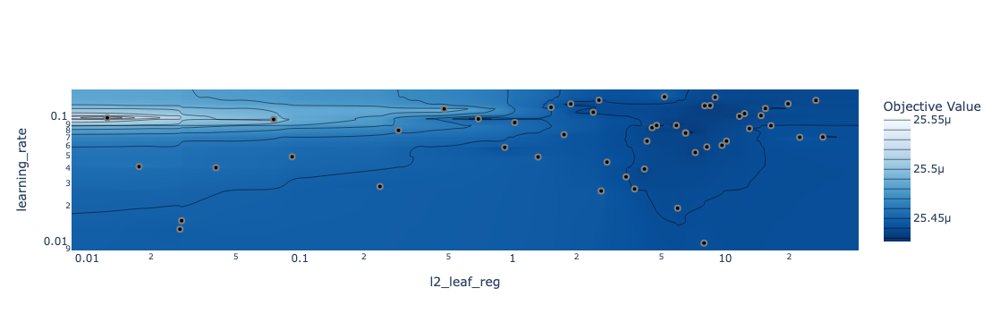

In [183]:
fig = optuna.visualization.plot_contour(study, params=["learning_rate", "l2_leaf_reg"])
fig.update_layout(title=None)
fig.show()

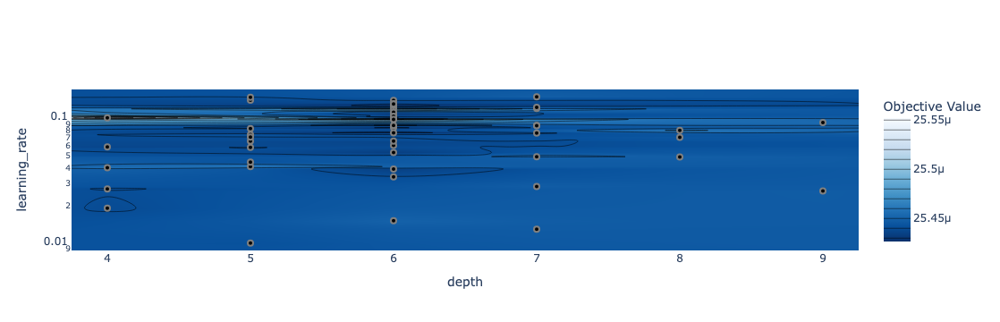

In [184]:
fig = optuna.visualization.plot_contour(study, params=["depth", "learning_rate"])
fig.update_layout(title=None)
fig.show()

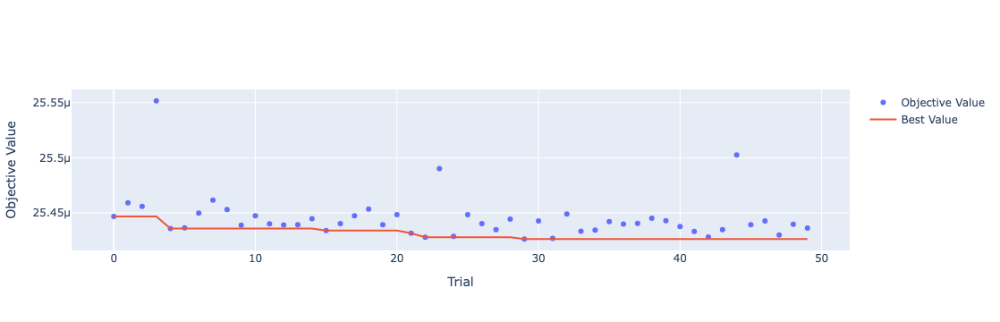

In [185]:
fig = optuna.visualization.plot_optimization_history(study)
fig.update_layout(title=None)
fig.show()

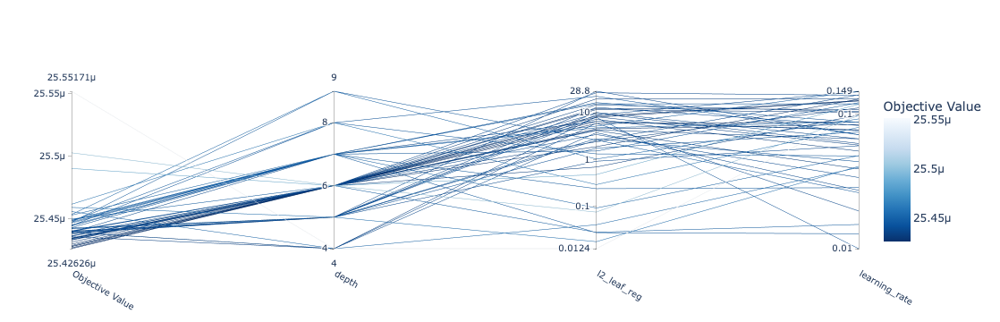

In [186]:
fig = optuna.visualization.plot_parallel_coordinate(study, params=["learning_rate", "depth",  "l2_leaf_reg"])
fig.update_layout(title=None)
fig.show()

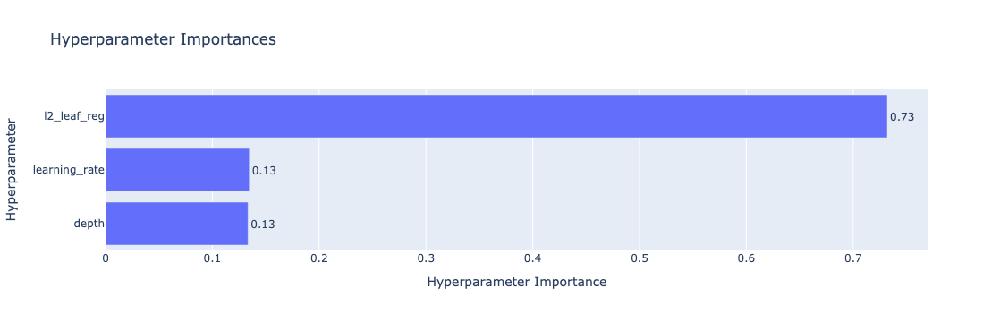

In [187]:
fig = optuna.visualization.plot_param_importances(study)
show(fig)

In [ ]:
#CME sampler Mean test MSE: 2.6854220502672674e-05 01:57
# Best validation MSE: 2.5424518296674126e-05
#Best params: {'learning_rate': 0.10033439283121538, 'depth': 6, 'l2_leaf_reg': 7.166932068970804}

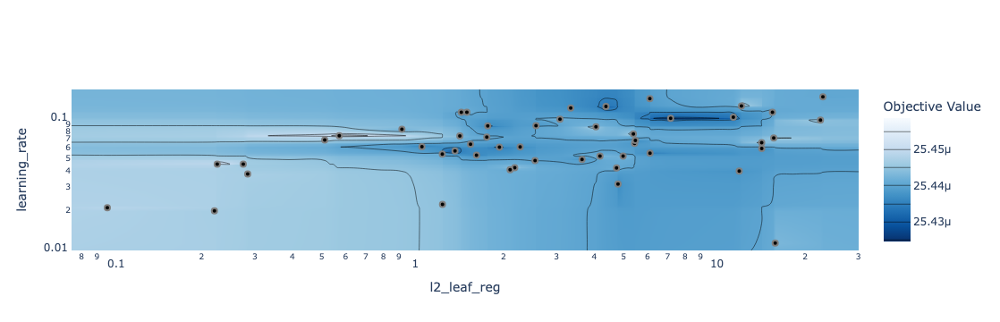

In [167]:
fig = optuna.visualization.plot_contour(study, params=["learning_rate", "l2_leaf_reg"])
fig.update_layout(title=None)
fig.show()

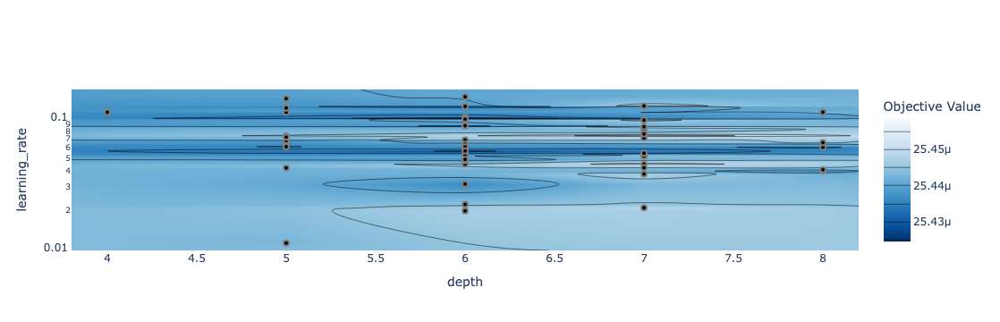

In [168]:
fig = optuna.visualization.plot_contour(study, params=["depth", "learning_rate"])
fig.update_layout(title=None)
fig.show()

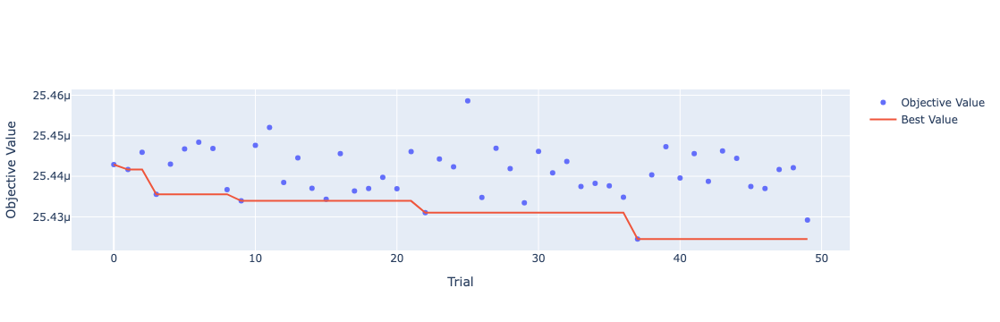

In [169]:
fig = optuna.visualization.plot_optimization_history(study)
fig.update_layout(title=None)
fig.show()

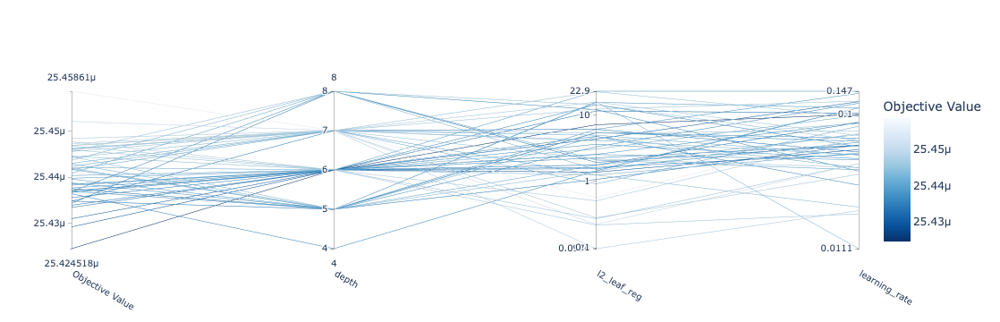

In [170]:
fig = optuna.visualization.plot_parallel_coordinate(study, params=["learning_rate", "depth",  "l2_leaf_reg"])
fig.update_layout(title=None)
fig.show()

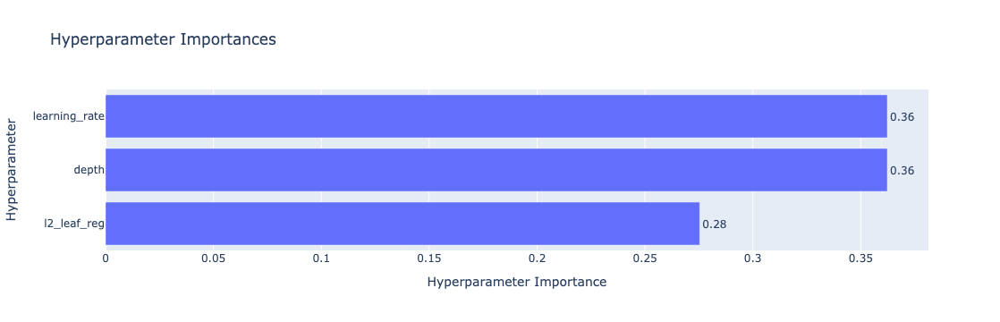

In [171]:
fig = optuna.visualization.plot_param_importances(study)
show(fig)

In [143]:
#  QMCSampler Mean test MSE: 2.738202942155653e-05 02:26
#Best validation MSE: 2.5433399633620987e-05
#Best params: {'learning_rate': 0.07003507409323474, 'depth': 6, 'l2_leaf_reg': 1.1602210615969406}

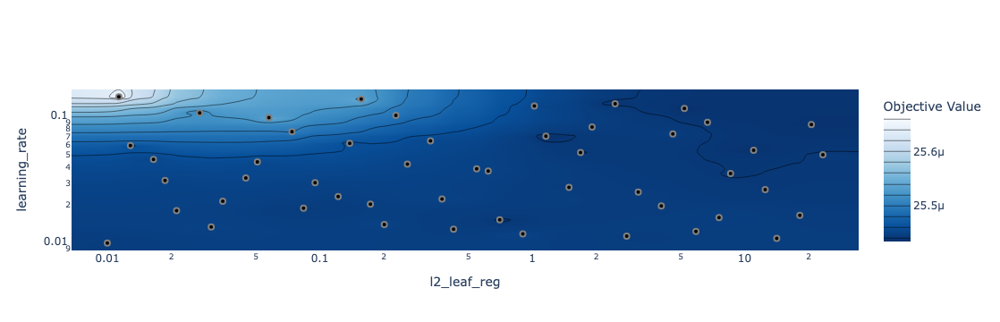

In [175]:
fig = optuna.visualization.plot_contour(study, params=["learning_rate", "l2_leaf_reg"])
fig.update_layout(title=None)
fig.show()

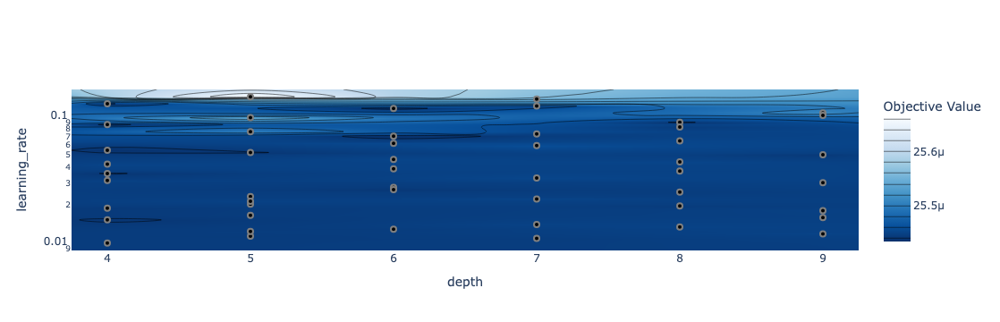

In [176]:
fig = optuna.visualization.plot_contour(study, params=["depth", "learning_rate"])
fig.update_layout(title=None)
fig.show()

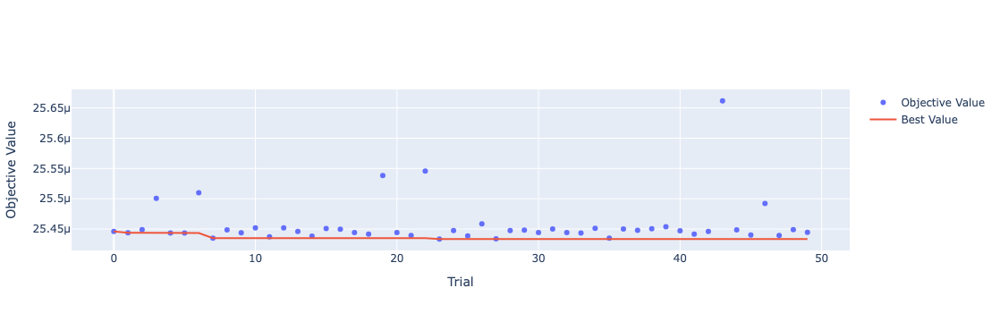

In [177]:
fig = optuna.visualization.plot_optimization_history(study)
fig.update_layout(title=None)
fig.show()

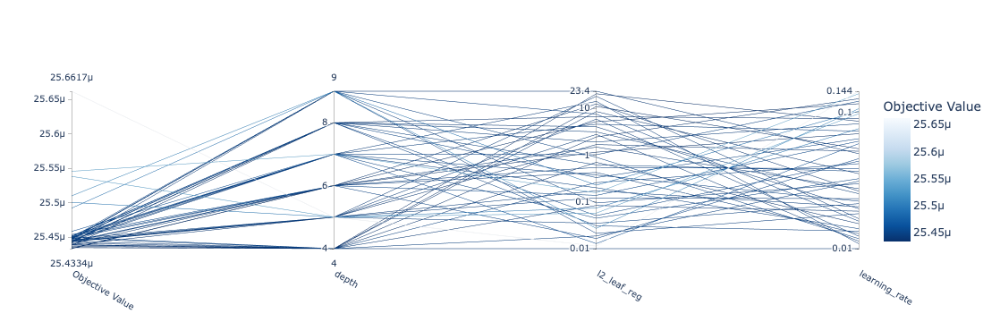

In [178]:
fig = optuna.visualization.plot_parallel_coordinate(study, params=["learning_rate", "depth",  "l2_leaf_reg"])
fig.update_layout(title=None)
fig.show()

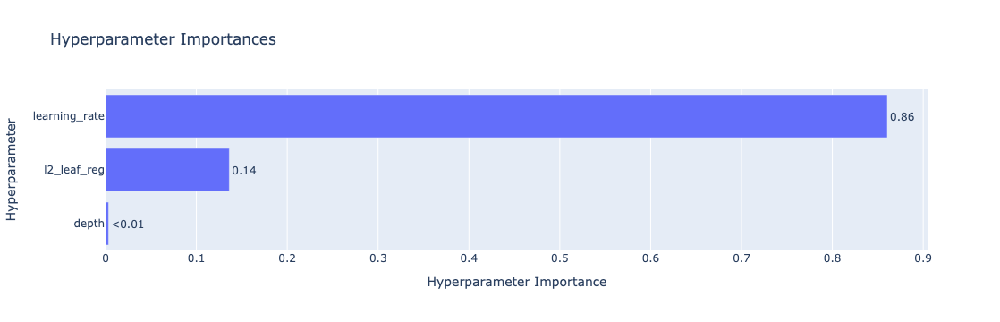

In [179]:
fig = optuna.visualization.plot_param_importances(study)
show(fig)

In [162]:
#GPSampler Mean test MSE: 2.637836226003621e-05 02:03
# Best validation MSE: 2.542946131400749e-05
# Best params: {'learning_rate': 0.15, 'depth': 4, 'l2_leaf_reg': 29.99999999999999}

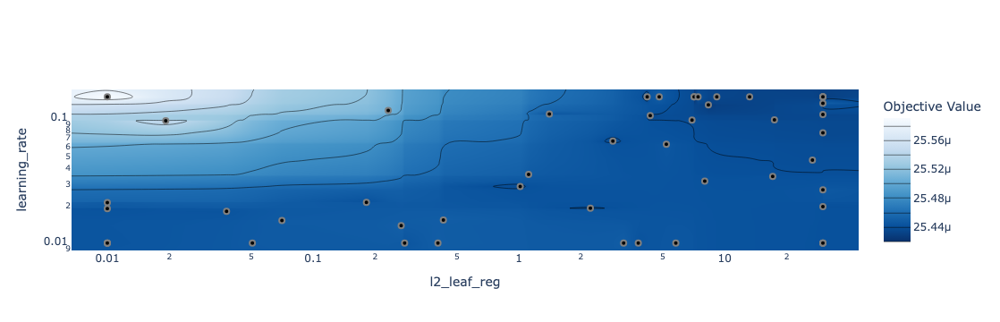

In [130]:
fig = optuna.visualization.plot_contour(study, params=["learning_rate", "l2_leaf_reg"])
fig.update_layout(title=None)
fig.show()

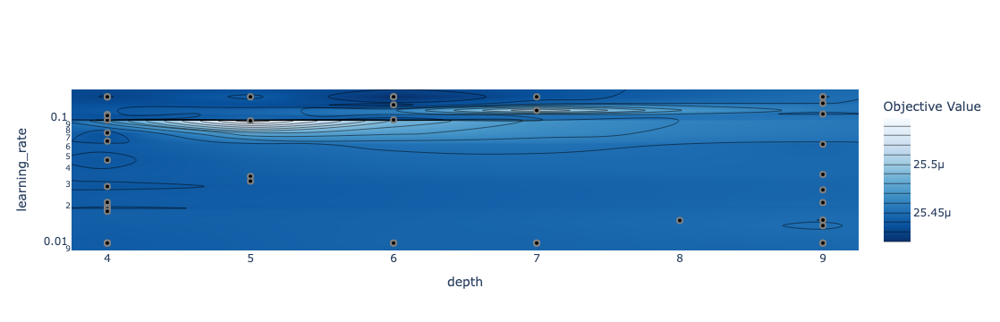

In [133]:
fig = optuna.visualization.plot_contour(study, params=["depth", "learning_rate"])
fig.update_layout(title=None)
fig.show()

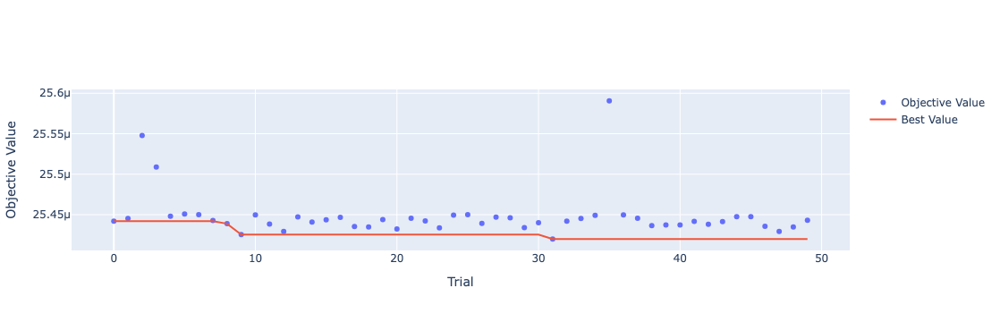

In [118]:
fig = optuna.visualization.plot_optimization_history(study)
fig.update_layout(title=None)
fig.show()

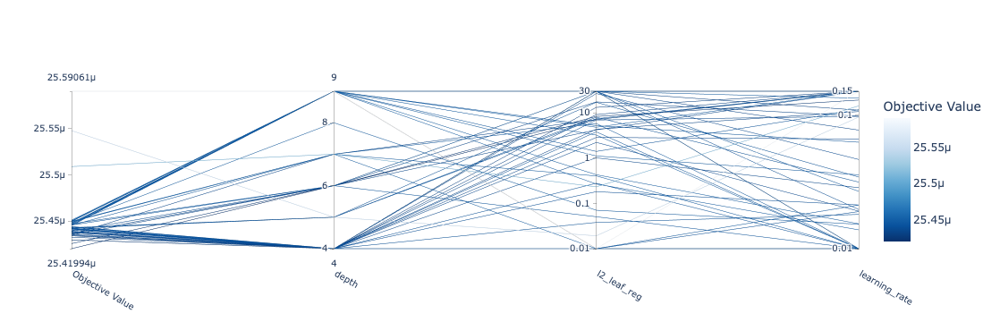

In [135]:
fig = optuna.visualization.plot_parallel_coordinate(study, params=["learning_rate", "depth",  "l2_leaf_reg"])
fig.update_layout(title=None)
fig.show()

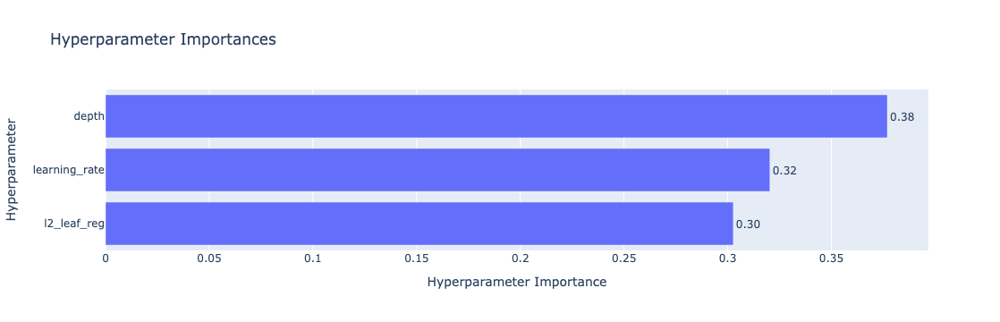

In [161]:
fig = optuna.visualization.plot_param_importances(study)
show(fig)

In [249]:
gps = pd.read_parquet('GPSampler.parquet')
cmaes = pd.read_parquet('CmaEsSampler.parquet')
tpe = pd.read_parquet('TPESampler.parquet')
qmc = pd.read_parquet('QMCSampler.parquet')

In [193]:
models = {
    "GPS": gps,
    "CMAES": cmaes,
    "TPE": tpe,
    "QMC": qmc,}

def dm_test(df1, df2):
    data = (
        df1[["y_true", "y_pred"]]
        .rename(columns={"y_pred": "pred1"})
        .join(
            df2[["y_pred"]].rename(columns={"y_pred": "pred2"}),
            how="inner"
        )
        .dropna()
    )

    e1 = data["y_true"] - data["pred1"]
    e2 = data["y_true"] - data["pred2"]

    d = e1**2 - e2**2

    dm = d.mean() / np.sqrt(d.var(ddof=1) / len(d))
    p = 2 * (1 - norm.cdf(abs(dm)))

    return dm, p

results = []

for m1, m2 in combinations(models.keys(), 2):
    dm, p = dm_test(models[m1], models[m2])
    results.append([m1, m2, dm, p])

results = pd.DataFrame(
    results,
    columns=["Model1", "Model2", "DM", "p-value"]
)

results

,Model1,Model2,DM,p-value
0,GPS,CMAES,18.465589,0.000000e+00
1,GPS,TPE,9.934415,0.000000e+00
2,GPS,QMC,7.001669,2.529310e-12
3,CMAES,TPE,-13.278605,0.000000e+00
4,CMAES,QMC,-15.894836,0.000000e+00
5,TPE,QMC,-1.550069,1.211249e-01


In [242]:
def walk_forward_positions(
    df,
    long_grid=np.linspace(0.70, 0.98, 15),
    short_grid=np.linspace(0.02, 0.30, 15),
    objective="pnl",
    commission=0.001
):
    df = df.sort_index().copy()
    folds = sorted(df["fold"].unique())
    result = []

    log_commission = np.log1p(commission)

    for test_fold in folds[2:]:

        train = df[df["fold"] < test_fold]
        test = df[df["fold"] == test_fold].copy()

        best_score = -np.inf
        best_quantiles = None

        for long_q, short_q in product(long_grid, short_grid):

            fold_scores = []

            for validation_fold in train["fold"].unique()[1:]:

                history = train[train["fold"] < validation_fold]
                validation = train[train["fold"] == validation_fold]

                long_threshold = history["y_pred"].quantile(long_q)
                short_threshold = history["y_pred"].quantile(short_q)

                pos = np.select(
                    [
                        validation["y_pred"] >= long_threshold,
                        validation["y_pred"] <= short_threshold
                    ],
                    [1, -1],
                    default=0
                )

                pnl = (
                    pos * validation["y_true"]
                    - (pos != 0) * log_commission
                )

                if objective == "pnl":
                    score = pnl.sum()

                elif objective == "mean":
                    score = pnl.mean()

                elif objective == "sharpe":
                    std = pnl.std(ddof=1)
                    score = pnl.mean() / std if std > 0 else np.nan

                else:
                    raise ValueError(
                        "objective must be 'pnl', 'mean' or 'sharpe'"
                    )

                if np.isfinite(score):
                    fold_scores.append(score)

            if not fold_scores:
                continue

            score = np.mean(fold_scores)

            if score > best_score:
                best_score = score
                best_quantiles = long_q, short_q

        long_q, short_q = best_quantiles

        long_threshold = train["y_pred"].quantile(long_q)
        short_threshold = train["y_pred"].quantile(short_q)

        test["pos"] = np.select(
            [
                test["y_pred"] >= long_threshold,
                test["y_pred"] <= short_threshold
            ],
            [1, -1],
            default=0
        ).astype(int)

        result.append(test[["pos"]])

    return pd.concat(result).sort_index()

In [259]:
positions = walk_forward_positions(gps, objective="pnl")
positions

,pos
datetime,
2023-06-18 20:00:00+00:00,0
2023-06-18 21:00:00+00:00,0
2023-06-18 22:00:00+00:00,0
2023-06-18 23:00:00+00:00,0
2023-06-19 00:00:00+00:00,0
...,...
2026-06-18 15:00:00+00:00,0
2026-06-18 16:00:00+00:00,0
2026-06-18 17:00:00+00:00,0


In [260]:
gps = gps.join(positions).dropna(subset=["pos"])

In [261]:
gps.to_parquet('gps.parquet')

In [262]:
dd = (
    df[["close"]]
    .join(gps[["pos"]].rename(columns={"pos": "GPS"}), how="left")
    .join(cmaes[["pos"]].rename(columns={"pos": "CMAES"}), how="left")
    .join(tpe[["pos"]].rename(columns={"pos": "TPE"}), how="left")
    .join(qmc[["pos"]].rename(columns={"pos": "QMC"}), how="left")
    .dropna(subset=["GPS", "CMAES", "TPE", "QMC"]))
dd[["GPS", "CMAES", "TPE", "QMC"]] = (
    dd[["GPS", "CMAES", "TPE", "QMC"]].astype(int))

In [263]:
dd.to_parquet('pos.parquet')

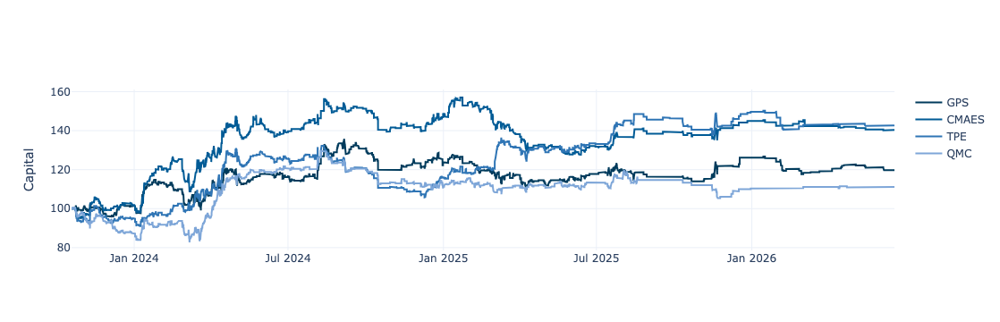

In [272]:
models = ["GPS", "CMAES", "TPE", "QMC"]
colors = ["#003B5C", "#005B96", "#2F75B5", "#7EA6D8"]

price_return = dd["close"].shift(-1) / dd["close"] - 1
commission = 0.000

capital = {}

for model in models:
    strategy_return = (
        dd[model] * price_return
        - dd[model].abs() * commission
    )

    capital[model] = 100 * (1 + strategy_return.fillna(0)).cumprod()

fig = go.Figure()

for model, color in zip(models, colors):
    fig.add_trace(
        go.Scatter(
            x=dd.index,
            y=capital[model],
            name=model,
            line=dict(color=color, width=2)
        )
    )

fig.update_layout(
    template="plotly_white",
    title="",
    xaxis_title="",
    yaxis_title="Capital",
    hovermode="x unified",
    legend_title="")
fig.show()

In [273]:
metrics = []
hours_per_year = 24 * 365
for model in models:
    ret = (
        dd[model] * price_return
        - dd[model].abs() * commission
    ).dropna()

    sharpe = np.sqrt(hours_per_year) * ret.mean() / ret.std()

    downside = ret[ret < 0]
    sortino = (
        np.sqrt(hours_per_year) * ret.mean() / downside.std()
        if len(downside) > 1 else np.nan
    )

    equity = 100 * (1 + ret).cumprod()

    drawdown = equity / equity.cummax() - 1
    max_dd = drawdown.min()

    metrics.append({
        "Model": model,
        "Sharpe": sharpe,
        "Sortino": sortino,
        "MaxDD": max_dd
    })

metrics = pd.DataFrame(metrics).round(3)

metrics

,Model,Sharpe,Sortino,MaxDD
0,GPS,0.487,0.179,-0.189
1,CMAES,0.840,0.296,-0.190
2,TPE,0.901,0.312,-0.200
3,QMC,0.336,0.127,-0.187
